# Notebook 1 do Projeto 1 do PB Ciência de Dados da Compass UOL.

#### Autora: Amanda Mota Passos


## 1. Importando pandas, matplotlib, plotly e seaborn 

In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

##### Aviso: todos os gráficos plotados com a biblioteca plotly não aparecem no github no output dos códigos, então a imagem destes gráficos está logo abaixo de cada código em células markdown

## 2. Lendo os arquivos .csv do projeto
##### Nesta seção, foi utilizada a função read_csv da biblioteca pandas para ler os arquivos do projeto

In [2]:
sellers = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_sellers_dataset.csv")
product_category_translation = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\product_category_name_translation.csv")
products = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_products_dataset.csv")
order_reviews = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_order_reviews_dataset.csv")
orders = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_orders_dataset.csv")
order_payments = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_order_payments_dataset.csv")
order_items = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_order_items_dataset.csv")
geolocation = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_geolocation_dataset.csv")
customers = pd.read_csv("C:\\Users\\amand\\Downloads\\tabelas do projeto\\olist_customers_dataset.csv")

##### Checando os tipos das variáveis de cada tabela

In [3]:
sellers.dtypes

seller_id                 object
seller_zip_code_prefix     int64
seller_city               object
seller_state              object
dtype: object

In [4]:
products.dtypes

product_id                     object
product_category_name          object
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object

In [5]:
order_reviews.dtypes

review_id                  object
order_id                   object
review_score                int64
review_comment_title       object
review_comment_message     object
review_creation_date       object
review_answer_timestamp    object
dtype: object

In [6]:
orders.dtypes

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

In [7]:
order_payments.dtypes

order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object

In [8]:
order_items.dtypes

order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
freight_value          float64
dtype: object

In [9]:
geolocation.dtypes

geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

In [10]:
customers.dtypes

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

## 3. Procurando dados faltantes e retirando as duplicatas


In [11]:
sellers.isnull().sum() #Não foram encontrados dados faltantes

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [12]:
sellers = sellers.drop_duplicates() #Removendo duplicatas (se existirem)

In [13]:
products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

##### Foram encontrados dados faltantes nas colunas product_category_name, product_name_lenght, product_description_lenght, product_photos_qty

In [14]:
products = products.drop_duplicates() #Removendo duplicatas (se existirem)

In [15]:
order_reviews.isnull().sum() 

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

##### Foram encontrados dados faltantes nas colunas review_comment_title e review_comment_message, mas elas não serão utilizadas nesta análise.

In [16]:
order_reviews = order_reviews.drop_duplicates() #Removendo duplicatas (se existirem)

In [17]:
orders.isnull().sum() 

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

##### Foram encontrados dados faltantes nas colunas order_approved_at, order_delivered_carrier_date e order_delivered_customer_date, mas elas não serão utilizadas nesta análise

In [18]:
orders = orders.drop_duplicates() #Removendo duplicatas (se existirem)

In [19]:
order_payments.isnull().sum() #Não foram encontrados dados faltantes

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [20]:
order_payments = order_payments.drop_duplicates() #Removendo duplicatas (se existirem)

In [21]:
order_items.isnull().sum() #Não foram encontrados dados faltantes

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [22]:
order_items = order_items.drop_duplicates() #Removendo duplicatas (se existirem)

In [23]:
geolocation.isnull().sum() #Não foram encontrados dados faltantes

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [24]:
geolocation = geolocation.drop_duplicates() #Removendo duplicatas (se existirem)

In [25]:
customers = customers.drop_duplicates() #Removendo duplicatas (se existirem)

In [26]:
customers.isnull().sum() #Não foram encontrados dados faltantes

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

## 4. Lidando com os dados faltantes
Como visto na seção anterior, existem dados faltantes em 3 das 8 tabelas.
A proposta é lidar com esses missing values de modo a minimizar a perda de informação, ou seja, evitando a exclusão de linhas inteiras onde há dados faltantes. Para variáveis quantitativas, o valor faltante será substituído pela mediana da coluna. Para variáveis qualitativas, o valor faltante será substituído pelo valor mais frequente da coluna.

* Tabela Products

1. Variável product_category_name

In [27]:
print(products.product_category_name.value_counts())
freq_category = products.product_category_name.value_counts()[0] 
#Escolhendo o valor de maior frequência na coluna para a substituição.

cama_mesa_banho                  3029
esporte_lazer                    2867
moveis_decoracao                 2657
beleza_saude                     2444
utilidades_domesticas            2335
                                 ... 
fashion_roupa_infanto_juvenil       5
casa_conforto_2                     5
pc_gamer                            3
seguros_e_servicos                  2
cds_dvds_musicais                   1
Name: product_category_name, Length: 73, dtype: int64


In [28]:
products.product_category_name.fillna(freq_category, inplace = True)
#Preenchendo valores ausentes com o valor escolhido

In [29]:
products.product_category_name.isnull().sum()
#Conferindo se os valores ausentes foram substituídos

0

2. Variável product_name_lenght

In [30]:
name_lenght_mediana = products.product_name_lenght.median()
print(name_lenght_mediana)
#Encontrando a mediana da coluna para a substituição.

51.0


In [31]:
products.fillna(name_lenght_mediana, inplace = True)
#Preenchendo valores ausentes com a mediana

In [32]:
products.product_name_lenght.isnull().sum()
#Conferindo se os valores ausentes foram substituídos

0

3. Variável product_description_lenght

In [33]:
description_lenght_mediana = products.product_description_lenght.median()
print(description_lenght_mediana)
#Encontrando a mediana da coluna para a substituição.

584.0


In [34]:
products.fillna(description_lenght_mediana, inplace = True)
#Preenchendo valores ausentes com a mediana

In [35]:
products.product_description_lenght.isnull().sum()
#Conferindo se os valores ausentes foram substituídos

0

4. Variável product_photos_qty

In [36]:
photo_qty_mediana = products.product_photos_qty.median()
print(photo_qty_mediana)
#Encontrando a mediana da coluna para a substituição.

1.0


In [37]:
products.fillna(photo_qty_mediana, inplace = True)
#Preenchendo valores ausentes com a mediana

In [38]:
products.product_photos_qty.isnull().sum()
#Conferindo se os valores ausentes foram substituídos

0

In [39]:
products.isnull().sum() #Todos os missing values desta tabela foram substituídos

product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64

## 5. Procurando outliers nas variáveis quantitativas utilizando o boxplot
Os outliers, além de vistos no boxplot, serão filtrados utilizando o Método de Tukey, que utliza os quartis para identificar os outliers. 

* Tabela Produtos

In [89]:
import plotly.graph_objects as go
grafico_produtos = go.Figure() 
  
grafico_produtos.add_trace(go.Box(y=products["product_length_cm"], name ="product_length_cm" )) 
grafico_produtos.add_trace(go.Box(y=products["product_weight_g"], name="product_weight_g")) 
grafico_produtos.add_trace(go.Box(y=products["product_height_cm"], name = "product_height_cm")) 
grafico_produtos.add_trace(go.Box(y=products["product_width_cm"], name="product_width_cm" )) 
grafico_produtos.add_trace(go.Box(y=products["product_photos_qty"], name ="product_photos_qty" )) 
grafico_produtos.add_trace(go.Box(y=products["product_description_lenght"], name="product_description_lenght" )) 
grafico_produtos.add_trace(go.Box(y=products["product_name_lenght"], name="product_name_lenght")) 

grafico_produtos.show()


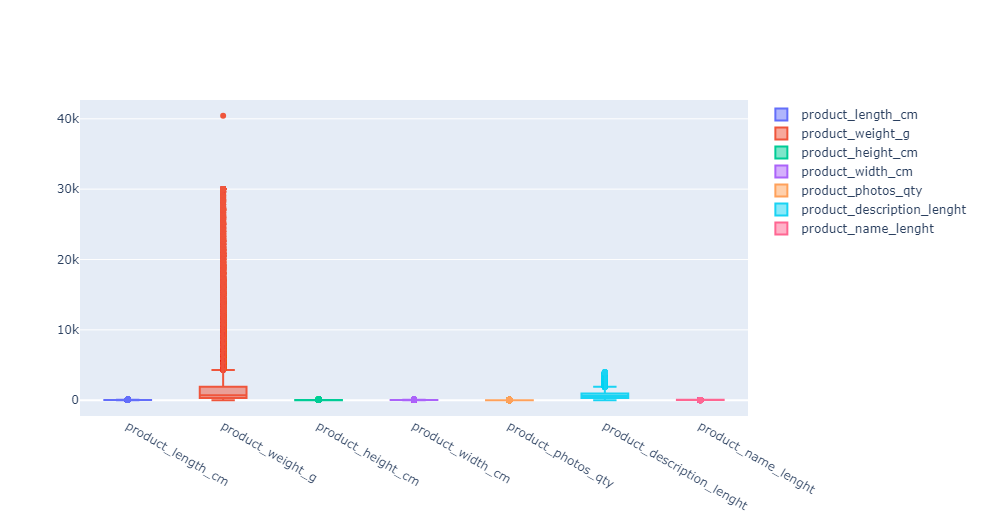

In [41]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


1. Variável product_name_lenght

In [42]:
Q3=products['product_length_cm'].quantile(0.75)
Q1=products['product_length_cm'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [43]:
products_so1=products.loc[(products['product_length_cm'] >= limIn) & (products['product_length_cm'] <= limSup)] 


Foi criada uma nova tabela products_so1 com os valores de product_length_cm sem os outliers, e a partir de agora, a cada coluna da qual são removidos os outliers, uma nova tabela será criada a partir da anterior, até que no fim, a tabela products_so será a tabela com todas as variáveis sem outliers

2. Variável product_weight_g

In [44]:
Q3=products_so1['product_weight_g'].quantile(0.75)
Q1=products_so1['product_weight_g'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [45]:
products_so2=products_so1.loc[(products_so1['product_weight_g'] >= limIn) & (products_so1['product_weight_g'] <= limSup)] 


3. Variável product_height_cm

In [46]:
Q3=products_so2['product_height_cm'].quantile(0.75)
Q1=products_so2['product_height_cm'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [47]:
products_so3=products_so2.loc[(products_so2['product_height_cm'] >= limIn) & (products_so2['product_height_cm'] <= limSup)] 


4. Variável product_width_cm

In [48]:
Q3=products_so3['product_width_cm'].quantile(0.75)
Q1=products_so3['product_width_cm'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [49]:
products_so4=products_so3.loc[(products_so3['product_height_cm'] >= limIn) & (products_so3['product_height_cm'] <= limSup)] 

5. Variável product_photos_qty

In [50]:
Q3=products_so4['product_photos_qty'].quantile(0.75)
Q1=products_so4['product_photos_qty'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [51]:
products_so5=products_so4.loc[(products_so4['product_photos_qty'] >= limIn) & (products_so4['product_photos_qty'] <= limSup)]

6. Variável product_description_lenght

In [52]:
Q3=products_so5['product_description_lenght'].quantile(0.75)
Q1=products_so5['product_description_lenght'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [53]:
products_so6=products_so5.loc[(products_so5['product_description_lenght'] >= limIn) & (products_so5['product_description_lenght'] <= limSup)]

7. Variável product_name_lenght

In [54]:
Q3=products_so6['product_name_lenght'].quantile(0.75)
Q1=products_so6['product_name_lenght'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [55]:
products_so=products_so6.loc[(products_so6['product_name_lenght'] >= limIn) & (products_so6['product_name_lenght'] <= limSup)]

* Tabela Order Reviews

In [56]:
order_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


1. Variável review_score

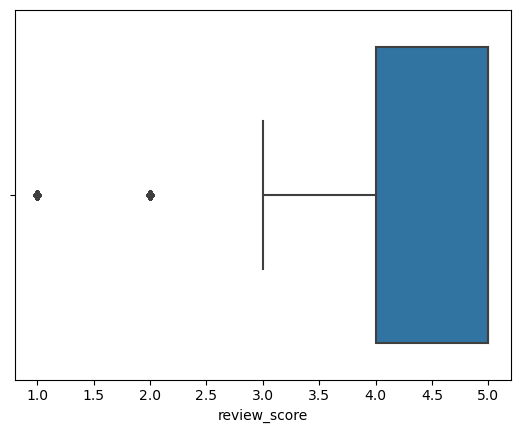

In [95]:
grafico_review_score = sns.boxplot(data = order_reviews, x= "review_score");

Neste caso, não será feita a filtragem dos valores considerados outliers, pois a variância das respostas é muito pequena (de 1 a 5), e, além disso, todos os valores serão levados em consideração ao analisar as reviews positivas e negativas.

* Tabela order_payments

1. Variável payment_value

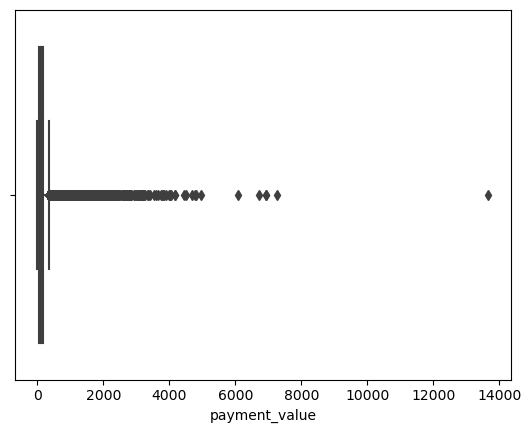

In [96]:
grafico_payment_value = sns.boxplot(data = order_payments, x= "payment_value");


In [59]:
Q3=order_payments['payment_value'].quantile(0.75)
Q1=order_payments['payment_value'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [60]:
order_payments_so=order_payments.loc[(order_payments['payment_value'] >= limIn) & (order_payments['payment_value'] <= limSup)]
orders_so = orders.loc[(order_payments['payment_value'] >= limIn) & (order_payments['payment_value'] <= limSup)]
#Modificando a tabela orders de acordo com a order_payments pois serão utlizadas juntas e é necessário que tenham o mesmo tamanho

* Tabela order_items

1. Variável price

In [61]:
grafico_items = go.Figure() 
  
grafico_items.add_trace(go.Box(y=order_items["price"], name ="price" )) 
grafico_items.add_trace(go.Box(y=order_items["freight_value"], name="freight_value")) 

grafico_items.show()


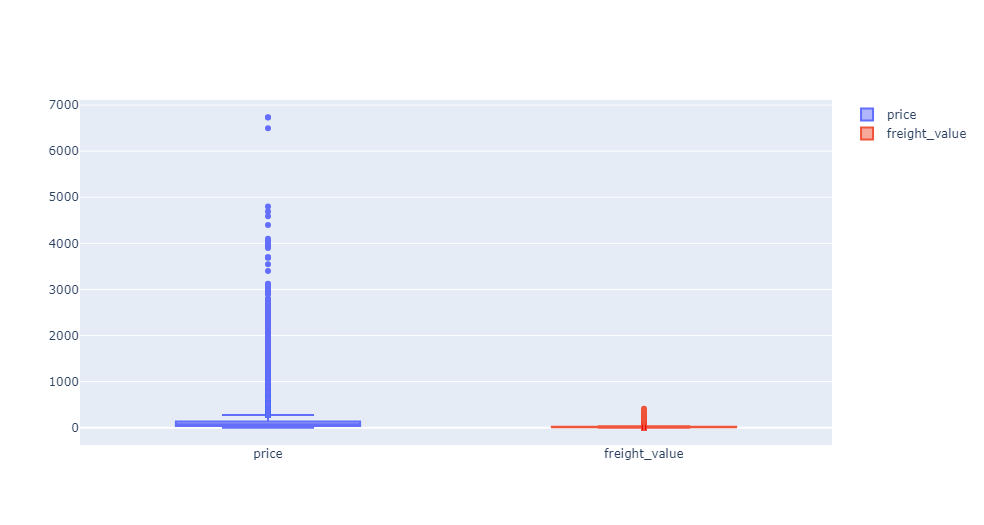

In [62]:
Q3=order_items['price'].quantile(0.75)
Q1=order_items['price'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [63]:
order_items_so1=order_items.loc[(order_items['price'] >= limIn) & (order_items['price'] <= limSup)]

2. Variável freight_value  

In [64]:
Q3=order_items_so1['freight_value'].quantile(0.75)
Q1=order_items_so1['freight_value'].quantile(0.25)
IQR = Q3 - Q1
limIn = Q1 - (IQR*1.5)
limSup = Q3 + (IQR*1.5)
#encontrando os quartis e os limites inferior e superior de acordo com Tukey

In [65]:
order_items_so=order_items_so1.loc[(order_items['freight_value'] >= limIn) & (order_items['freight_value'] <= limSup)]

## 6. Identificação das distribuições das variáveis (normais ou anormais)
Para cada variável quantitativa a ser utilizada na análise, será realizada a análise da distribuição da mesma. Para isso, será feita a análise do QQ Plot, gráfico que compara os quantis teóricos de uma distribuição normal e os quantis dos dados que obtemos. Além disso, será utlizado o teste de Kolmogorov-Smirnov (também chamado de Teste Lilliefors).
No output do teste, haverá dois valores, sendo o primeiro deles a estatística de teste e o segundo deles o p-valor do teste. A um nível de significância de 0.05, tem-se que: se o p-valor do teste for < 0.05, rejeita-se a hipótese nula, e se o p-valor do teste for >= 0.05, não se rejeita a hipótese nula. Sabe-se que as hipóteses do teste de normalidade são:
* H0 (hipótese nula): A amostra é proveniente de uma distribuição normal.
* Ha (hipótese alternativa): A amostra não é proveniente de uma distribuição normal.



* Tabela products_so

1. Variável product_name_lenght 

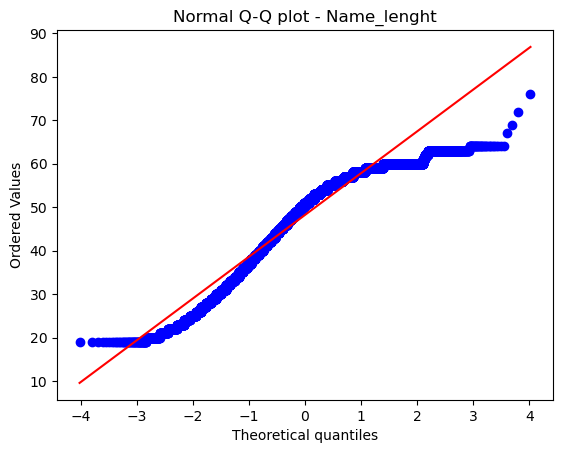

In [66]:
import scipy.stats as stats #Biblioteca que contém a função do QQPlot
stats.probplot(products_so['product_name_lenght'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Name_lenght")
plt.show()

In [67]:
import statsmodels #biblioteca que contém a função do Teste Lilliefors
from statsmodels.stats.diagnostic import lilliefors

In [68]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_name_lenght, dist="norm")

(0.12026079044544657, 0.0009999999999998899)

2. Variável product_description_lenght

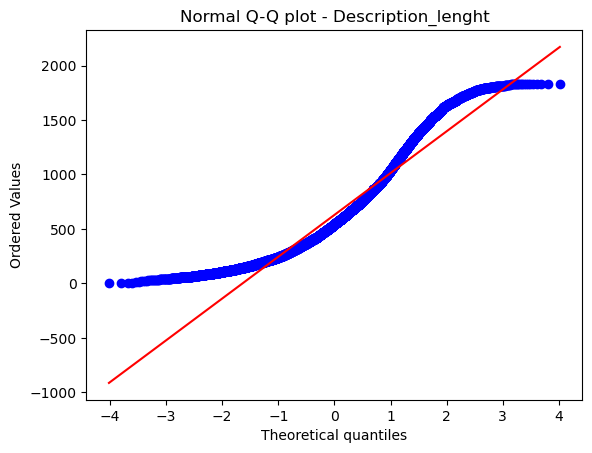

In [69]:
stats.probplot(products_so['product_description_lenght'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Description_lenght")
plt.show()

In [70]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_description_lenght, dist="norm")

(0.08678380612693659, 0.0009999999999998899)

3. Variável product_length_cm

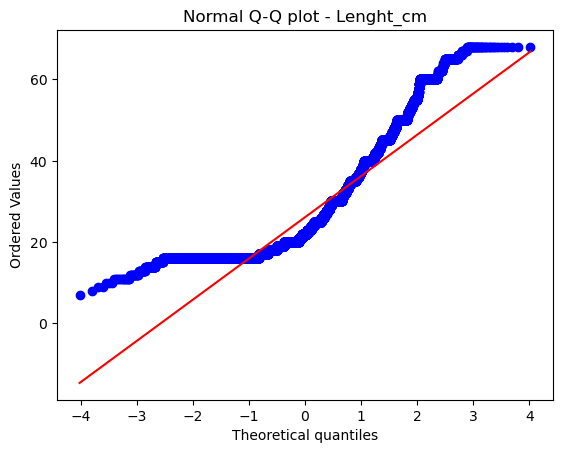

In [71]:
stats.probplot(products_so['product_length_cm'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Lenght_cm")
plt.show()

In [72]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_length_cm, dist="norm")

(0.17302275863360486, 0.0009999999999998899)

4. Variável product_weight_g

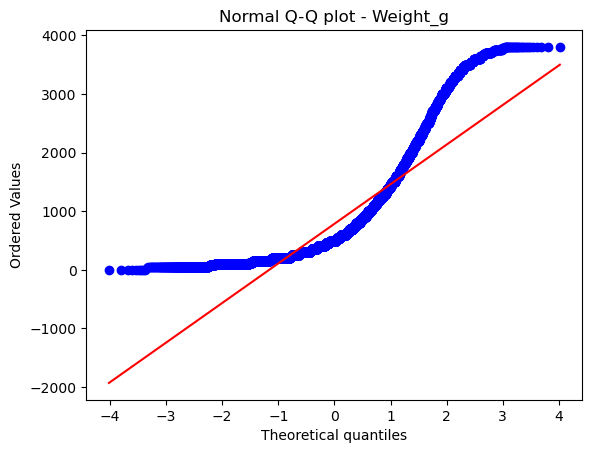

In [73]:
stats.probplot(products_so['product_weight_g'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Weight_g")
plt.show()

In [74]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_weight_g, dist="norm")

(0.17829078772534662, 0.0009999999999998899)

5. Variável product_height_cm

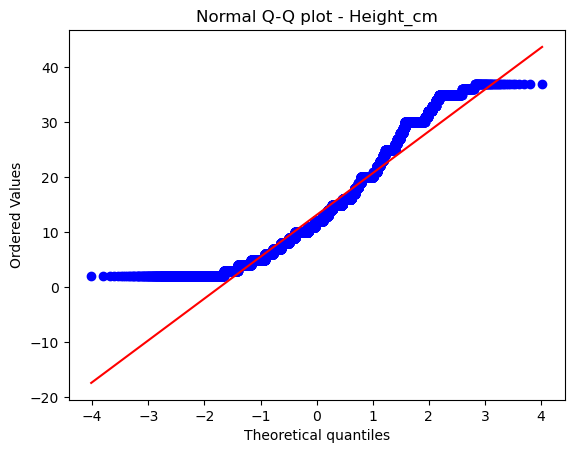

In [75]:
stats.probplot(products_so['product_height_cm'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Height_cm")
plt.show()

In [76]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_height_cm, dist="norm")

(0.1021798754592727, 0.0009999999999998899)

6. Variável product_width_cm

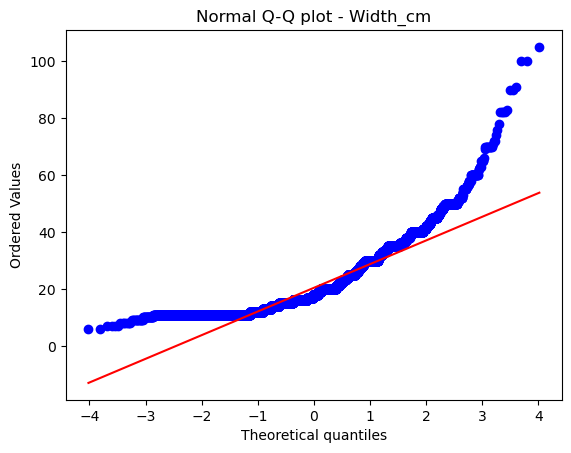

In [77]:
stats.probplot(products_so['product_width_cm'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Width_cm")
plt.show()

In [78]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_width_cm, dist="norm")

(0.17004964299225467, 0.0009999999999998899)

7. Variável product_photos_qty

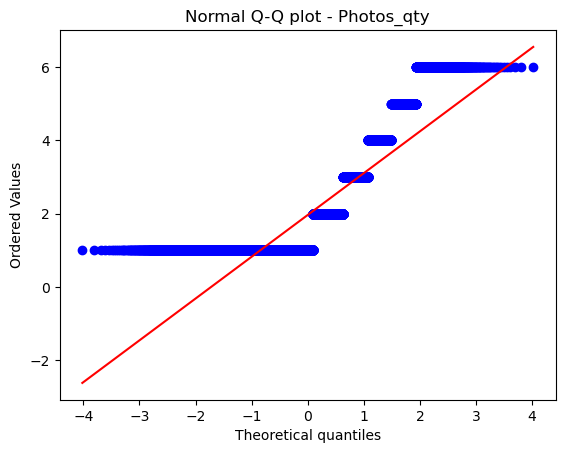

In [79]:
stats.probplot(products_so['product_photos_qty'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Photos_qty")
plt.show()

In [80]:
statsmodels.stats.diagnostic.lilliefors(products_so.product_photos_qty, dist="norm")

(0.3032767728558185, 0.0009999999999998899)

Como definido acima, se o p-valor < 0.05, rejeita-se a hipótese nula. Como temos que o p-valor é aproximadamente 0.00099 em todas as variáveis, rejeitamos a hipótese nula (ou seja, as variáveis não possuem distribuição normal). Além disso, nenhuma das variáveis possui um QQPlot no qual a linha azul (quantis dos dados) coincida com a linha vermelha (quantis teóricos de uma normal). Logo, temos duas evidências de que nenhuma das variáveis da tabela products_so segue uma distribuição normal.

* Tabela order_reviews - Variável review_score

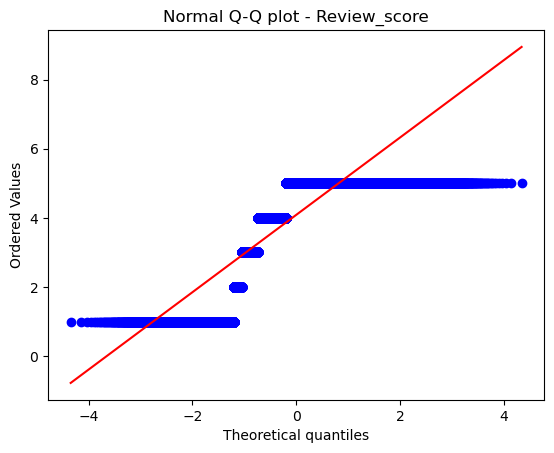

In [81]:
stats.probplot(order_reviews['review_score'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Review_score")
plt.show()

In [82]:
statsmodels.stats.diagnostic.lilliefors(order_reviews.review_score, dist="norm")

(0.3288589476161992, 0.0009999999999998899)

Como definido acima, se o p-valor < 0.05, rejeita-se a hipótese nula. Como temos que o p-valor é aproximadamente 0.00099, rejeitamos a hipótese nula (ou seja, a variável não possui distribuição normal). Além disso, a linha azul (quantis dos dados) do QQPlot não coincide com a linha vermelha (quantis teóricos de uma normal). Logo, temos duas evidências de que esta variável não segue uma distribuição normal.

* Tabela order_payments_so - Variável payment_value

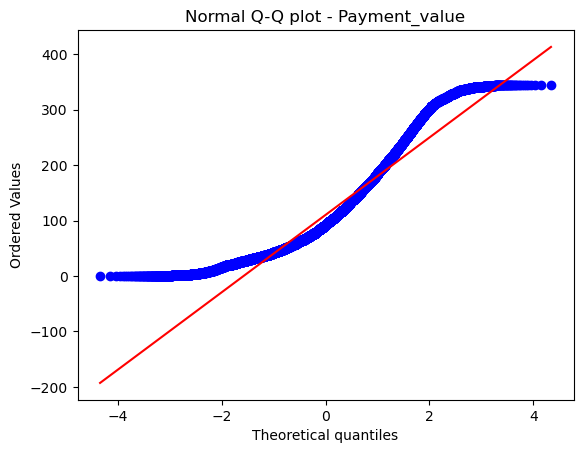

In [83]:
stats.probplot(order_payments_so['payment_value'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Payment_value")
plt.show()

In [84]:
statsmodels.stats.diagnostic.lilliefors(order_payments_so.payment_value, dist="norm")

(0.09886785648904817, 0.0009999999999998899)

Como definido acima, se o p-valor < 0.05, rejeita-se a hipótese nula. Como temos que o p-valor é aproximadamente 0.00099, rejeitamos a hipótese nula (ou seja, a variável não possui distribuição normal). Além disso, a linha azul (quantis dos dados) do QQPlot não coincide com a linha vermelha (quantis teóricos de uma normal). Logo, temos duas evidências de que esta variável não segue uma distribuição normal.

* Tabela order_items_so

1. Variável price

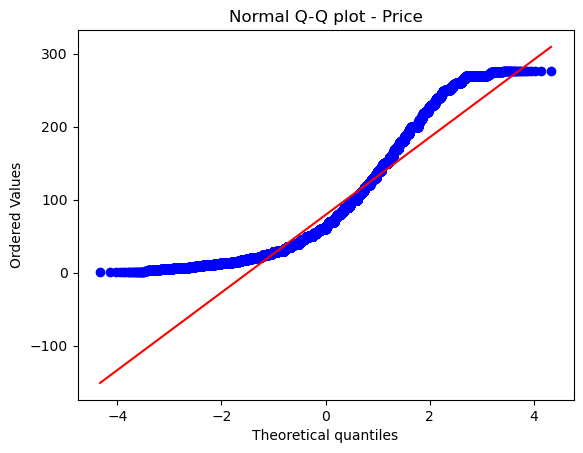

In [85]:
stats.probplot(order_items_so['price'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Price")
plt.show()

In [86]:
statsmodels.stats.diagnostic.lilliefors(order_items_so.price, dist="norm")

(0.13389761236244546, 0.0009999999999998899)

2. Variável freight_value

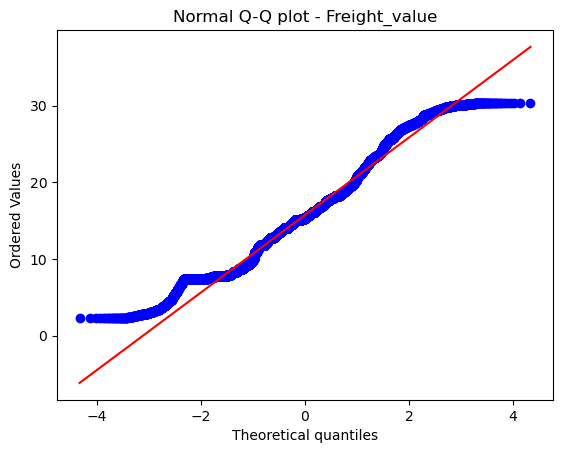

In [87]:
stats.probplot(order_items_so['freight_value'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Freight_value")
plt.show()

In [88]:
statsmodels.stats.diagnostic.lilliefors(order_items_so.freight_value, dist="norm")

(0.055933487086110456, 0.0009999999999998899)

Como definido acima, se o p-valor < 0.05, rejeita-se a hipótese nula. Como temos que o p-valor é aproximadamente 0.00099 em todas as variáveis, rejeitamos a hipótese nula (ou seja, as variáveis não possuem distribuição normal). Além disso, nenhuma das variáveis possui um QQPlot no qual a linha azul (quantis dos dados) coincida com a linha vermelha (quantis teóricos de uma normal). Logo, temos duas evidências de que nenhuma das variáveis da tabela products_so segue uma distribuição normal.

## 7. Salvando as novas tabelas 
A continuação do desafio estará no próximo notebook, logo, as tabelas que tiveram seus outliers cortados, e também as que não tiveram (para padronizar os nomes), serão encontradas com os nomes a seguir.

In [91]:
products_so.to_csv('products_treated.csv', encoding = 'iso-8859-1', index = False)

In [92]:
order_payments_so.to_csv('order_payments_treated.csv', encoding = 'iso-8859-1', index = False)

In [93]:
order_items_so.to_csv('order_items_treated.csv', encoding = 'iso-8859-1', index = False)

In [94]:
order_reviews.to_csv('order_reviews_treated.csv', encoding = 'utf-8', index = False)

In [95]:
sellers.to_csv('sellers_treated.csv', encoding = 'utf-8', index = False)

In [96]:
orders_so.to_csv('orders_treated.csv', encoding = 'iso-8859-1', index = False)

In [97]:
geolocation.to_csv('geolocation_treated.csv', encoding = 'iso-8859-1', index = False, errors='ignore')

In [98]:
customers.to_csv('customers_treated.csv', encoding = 'iso-8859-1', index = False)